# Problem 1

We need to recreate fig 5.1 and fig 5.2 from the textbook:  

Starting with figure 5.1:  

In [1]:
import numpy as np

@np.vectorize
def squared_error_loss(error):
    return error**2

@np.vectorize
def absolute_error_loss(error):
    return np.abs(error)

@np.vectorize
def huber_loss(error):
    if np.abs(error) < 1:
        return 0.5*error**2
    else:
        return np.abs(error) - 0.5

@np.vectorize
def epsilon_insensitive_loss(error, eps=0.8):
    if np.abs(error) < eps:
        return 0
    else:
        return np.abs(error) - eps

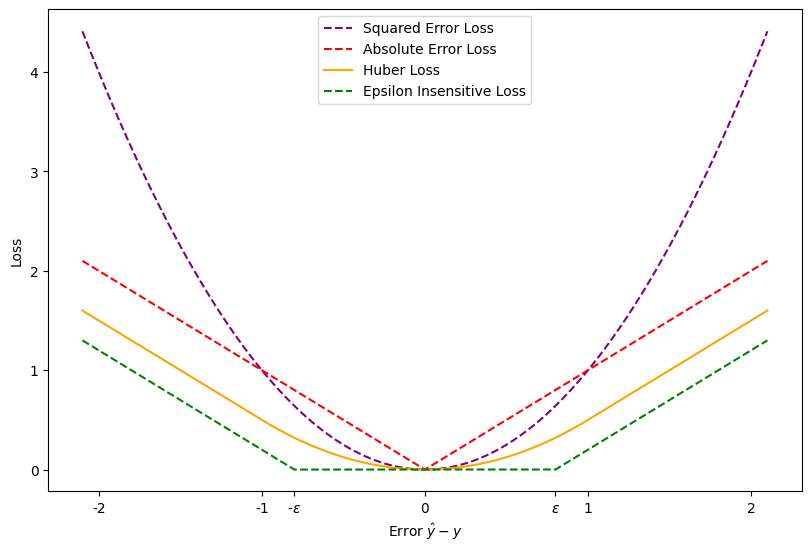

In [2]:
import matplotlib.pyplot as plt
error = np.linspace(-2.1, 2.1, 1000)
# error = np.linspace(-8.1, 8.1, 1000)
eps = 0.8

fig, ax = plt.subplots(1, 1, figsize=(8, 5.4), layout='constrained')
ax.plot(error, squared_error_loss(error), label="Squared Error Loss", color="purple", linestyle="--")
ax.plot(error, absolute_error_loss(error), label="Absolute Error Loss", color="red", linestyle="--")
ax.plot(error, huber_loss(error), label="Huber Loss", color="orange", linestyle="-")
ax.plot(error, epsilon_insensitive_loss(error), label="Epsilon Insensitive Loss", color="green", linestyle="--")


ax.set_xticks([-2, -1, -eps, 0, eps, 1, 2], ["-2", "-1", r"-$\epsilon$", "0", r"$\epsilon$", "1", "2"])
ax.set_xlabel("Error "+r"$\hat{y}-y$")
ax.set_ylabel("Loss")
ax.legend()

Most Robust to Least robust:
1. Epsilon Insensitive Loss
2. Huber Loss
3. Absolute Error Loss
4. Squared Error Loss

It should be noted that Epsilon Insensitive Loss, Huber Loss, and Absolute Error Loss are all linear with the same slope (asymptotically in the case of Huber loss) for large error magnitudes. Thus, in the sense that they are these are all linear with the same slope, you might say that they are essentially the same shape and in that sense similarly robust. Since these functions had the same shape in their limit, I ordered them according to which ones more highly penalised error (the larger penalties being what I called "least robust").

Now, we move on to 5.2

In [3]:
@np.vectorize
def misclassification_loss(margin):
    if margin < 0:
        return 1
    else:
        return 0
    
@np.vectorize
def hinge_loss(margin):
    if margin <= 1:
        return 1-margin
    else:
        return 0

@np.vectorize
def squared_hinge_loss(margin):
    if margin <= 1:
        return (1-margin)**2
    else:
        return 0

@np.vectorize
def huberised_squared_hinge_loss(margin):
    if margin <= -1:
        return -4*margin
    elif margin <= 1:
        return squared_hinge_loss(margin)
    else:
        return 0

@np.vectorize
def exponential_loss(margin):
    return np.exp(-margin)

@np.vectorize
def logistic_loss(margin):
    return np.log(1+np.exp(-margin))

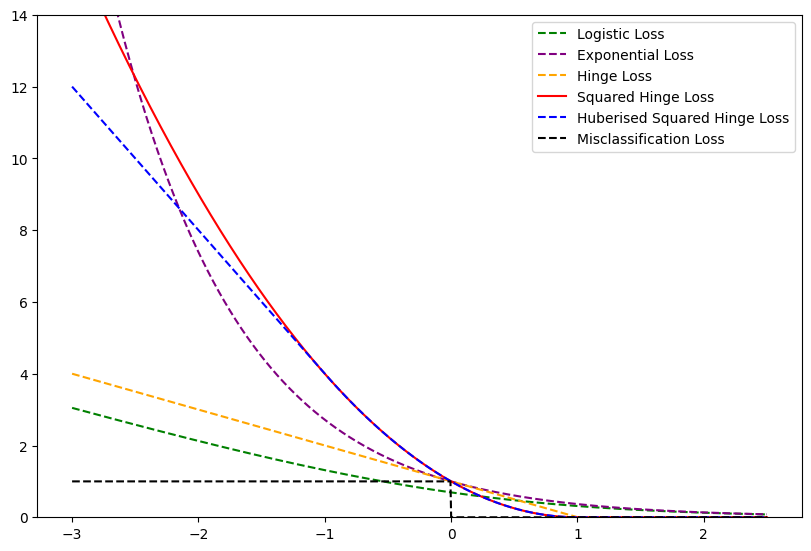

In [4]:
margin = np.linspace(-3, 2.5, 1000)
# margin = np.linspace(-20, 10, 1000)

fig, ax = plt.subplots(1, 1, figsize=(8, 5.4), layout='constrained')
ax.plot(margin, logistic_loss(margin), label="Logistic Loss", color="green", linestyle="--")
ax.plot(margin, exponential_loss(margin), label="Exponential Loss", color="purple", linestyle="--")
ax.plot(margin, hinge_loss(margin), label="Hinge Loss", color="orange", linestyle="--")
ax.plot(margin, squared_hinge_loss(margin), label="Squared Hinge Loss", color="red", linestyle="-")
ax.plot(margin, huberised_squared_hinge_loss(margin), label="Huberised Squared Hinge Loss", color="blue", linestyle="--")
ax.plot(margin, misclassification_loss(margin), label="Misclassification Loss", color="black", linestyle="--")

ax.set_ylim([0, 14])
# ax.set_ylim([-10, 30])
plt.legend()

Most robust to least robust: 

1. Misclassification Loss
2. Logistic Loss
3. Hinge Loss
4. Huberised Squared Error Loss
5. Squared Hinge Loss 
6. Exponential Loss

** Again, it should be noted that logistic loss and squared hinge loss have essentially the same "robustness" because they are both essentially linear with the same slope for large negative values of error. I only placed logistic loss above hinge loss, because logistic loss was slightly less penalizing of outltiers.

# Problem 2

In [5]:
from numpy.random import normal, uniform, seed
import matplotlib.pyplot as plt
import numpy as np

# seed(6) # eh
# seed(7) # Good
# seed(11) # Very good
# seed(16) # okay
# seed(17) # Fire
# seed(26) # What happens when overfitting and not a lot of training data on left
# seed(27) # I like it
seed(29) # My favorite

num_training_points = 25
sigma = 0.1

x_train = np.array(uniform(low=0, high=1, size=num_training_points), dtype="double")
error = np.array(normal(loc=0, scale=sigma, size=num_training_points), dtype="double")
y_train = np.array(np.sin(2*np.pi*x_train) + error, dtype="double")

In [6]:
num_test_points = 200

x_test = np.array(uniform(low=0, high=1, size=num_test_points), dtype="double")
error = np.array(normal(loc=0, scale=sigma, size=num_test_points), dtype="double")
y_test = np.array(np.sin(2*np.pi*x_test) + error, dtype="double")

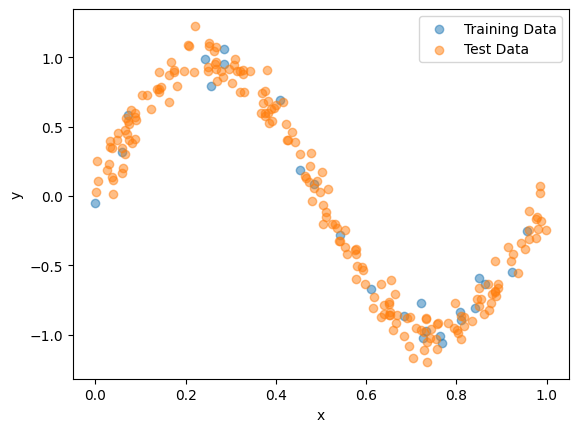

In [7]:
opacity = 0.5
plt.scatter(x_train, y_train, alpha=opacity, label="Training Data")
plt.scatter(x_test, y_test, alpha=opacity, label="Test Data")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()

# Problems 3 - 4

Note that I am modifying the polynomial regression functions that I wrote in homework 4 using equation 5.24 from the textbook
![](eq5p24.png) 

When $\lambda = 0$, this equation is equivlant to simply left multiplying y by the Moore-Penrose pseudo-inverse (which we will do in this problem)

In [8]:
def calculate_X(x_data):
    if len(x_data.shape) < 2:
        x_data = np.atleast_2d(x_data).reshape((x_data.shape[0], 1))
    n=x_data.shape[0]
    p=x_data.shape[1]
    X = np.zeros((n, p+1), dtype="double")
    
    for i in range(n):
        X[i, :] = np.array([1] + list(x_data[i]), dtype="double")
    return X

def calculate_theta_hat(x_data, y_data, lam=0):
    X = calculate_X(x_data)
    n = x_data.shape[0]
    p = x_data.shape[1]
    # return np.linalg.pinv(X)@y_data
    # return np.linalg.inv(X.T @ X + n*lam*np.eye(p+1))@X.T@y_data # Calculating the inverse not accurate enough
    return np.linalg.solve(X.T @ X + n*lam*np.eye(p+1), X.T@y_data)

def calculate_y_hat(x, theta):
    x = np.array(x)
    if len(x.shape) < 2:
        x = np.atleast_2d(x).reshape((x.shape[0], 1))
    m = x.shape[0]
    y_hat = np.zeros((m,), dtype=float)
    for i in range(m):
        y_hat[i] = theta[0] + np.dot(theta[1:], x[i])
    return y_hat

def get_polynomial_inputs(x_data, order=1):
    x_data = np.array(x_data, dtype="double")
    if len(x_data.shape) < 2:
        x_data = np.atleast_2d(x_data).reshape((x_data.shape[0], 1))

    num_data_points = x_data.shape[0]
    new_x_data = np.zeros((num_data_points, order+1), dtype="double")
    
    for i, x in enumerate(x_data[:, 0]):
        new_x_data[i, :] = np.array([x**j for j in range(order+1)], dtype="double")
    
    return new_x_data[:, 1:] # We don't need to return the first unity term, in fact, our linear regression code doesn't expect it

In [9]:
import pandas as pd

x = np.linspace(0, 1, 1000)
X = calculate_X(get_polynomial_inputs(x_train, order=10))

print(f"X = {pd.DataFrame(X)}")

X =      0         1             2             3             4             5   \
0   1.0  0.863760  7.460813e-01  6.444352e-01  5.566373e-01  4.808010e-01   
1   1.0  0.284906  8.117141e-02  2.312622e-02  6.588798e-03  1.877188e-03   
2   1.0  0.073256  5.366498e-03  3.931303e-04  2.879931e-05  2.109733e-06   
3   1.0  0.763237  5.825310e-01  4.446094e-01  3.393424e-01  2.589987e-01   
4   1.0  0.452719  2.049545e-01  9.278683e-02  4.200637e-02  1.901708e-02   
5   1.0  0.542297  2.940859e-01  1.594819e-01  8.648652e-02  4.690137e-02   
6   1.0  0.726636  5.279996e-01  3.836634e-01  2.787835e-01  2.025741e-01   
7   1.0  0.848905  7.206399e-01  6.117549e-01  5.193218e-01  4.408550e-01   
8   1.0  0.768200  5.901312e-01  4.533388e-01  3.482548e-01  2.675294e-01   
9   1.0  0.733144  5.374997e-01  3.940645e-01  2.889059e-01  2.118096e-01   
10  1.0  0.241986  5.855743e-02  1.417010e-02  3.428973e-03  8.297648e-04   
11  1.0  0.720309  5.188446e-01  3.737283e-01  2.691997e-01  1.939069e-0

In [10]:
theta_hat = calculate_theta_hat(get_polynomial_inputs(x_train, order=10), y_train)
for i, theta_i in enumerate(theta_hat):
    print(f"theta_{i} = {theta_i}")

theta_0 = -0.04757691516245359
theta_1 = -37.41209638618033
theta_2 = 1509.0844545218574
theta_3 = -18538.27705656643
theta_4 = 115000.43813617105
theta_5 = -414831.6495132705
theta_6 = 921351.040380084
theta_7 = -1278656.9740001017
theta_8 = 1081082.5428637285
theta_9 = -509535.38369144424
theta_10 = 102659.57462281953


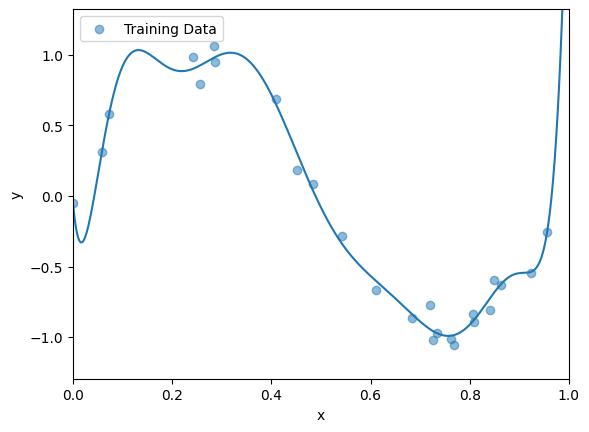

In [11]:
y_hat = calculate_y_hat(get_polynomial_inputs(x, order=10), theta_hat)

plt.scatter(x_train, y_train, alpha=opacity, label="Training Data")
# plt.scatter(x_test, y_test, alpha=opacity, label="Test Data")
plt.plot(x, y_hat)
plt.xlabel("x")
plt.ylabel("y")
plt.xlim([0, 1])
plt.ylim([np.min(y_test) - sigma, np.max(y_test) + sigma])
plt.legend()


MSE Train = 0.0045823564484148436
MSE Test = 0.11412295386406282


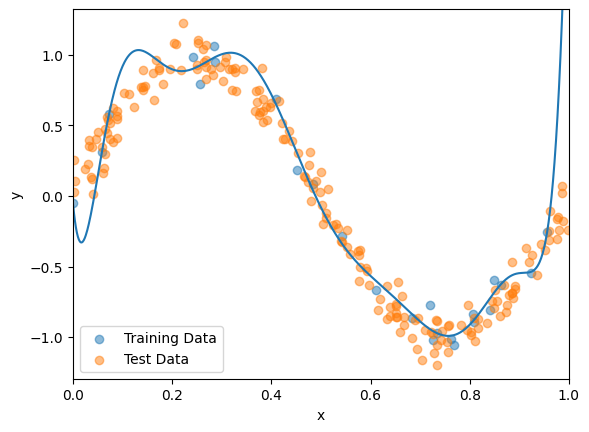

In [12]:
from sklearn.metrics import mean_squared_error

y_hat_train = calculate_y_hat(get_polynomial_inputs(x_train, order=10), theta_hat)
y_hat_test = calculate_y_hat(get_polynomial_inputs(x_test, order=10), theta_hat)

mse_train = mean_squared_error(y_hat_train, y_train)
mse_test = mean_squared_error(y_hat_test, y_test)

print(f"MSE Train = {mse_train}")
print(f"MSE Test = {mse_test}")

plt.scatter(x_train, y_train, alpha=opacity, label="Training Data")
plt.scatter(x_test, y_test, alpha=opacity, label="Test Data")
plt.plot(x, y_hat)
plt.xlabel("x")
plt.ylabel("y")
plt.xlim([0, 1])
plt.ylim([np.min(y_test) - sigma, np.max(y_test) + sigma])
plt.legend()


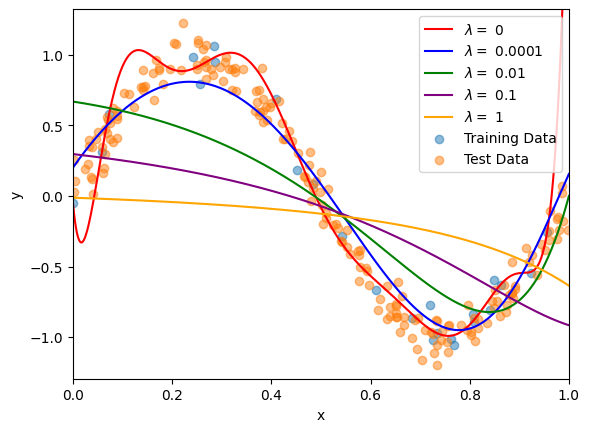

In [13]:
lams = [0, 10**-4, 10**-2, 10**-1, 1]

training_mse = []
test_mse = []
colors = ["red", "blue", "green", "purple", "orange"]

for lam, color in zip(lams, colors):
    x = np.linspace(0, 1, 1000, dtype="double")
    X = calculate_X(get_polynomial_inputs(x_train, order=10))
    theta_hat = calculate_theta_hat(get_polynomial_inputs(x_train, order=10), y_train, lam=lam)
    y_hat = calculate_y_hat(get_polynomial_inputs(x, order=10), theta_hat)

    y_hat_train = calculate_y_hat(get_polynomial_inputs(x_train, order=10), theta_hat)
    y_hat_test = calculate_y_hat(get_polynomial_inputs(x_test, order=10), theta_hat)

    mse_train = mean_squared_error(y_hat_train, y_train)
    mse_test = mean_squared_error(y_hat_test, y_test)

    training_mse.append(mse_train)
    test_mse.append(mse_test)

    # print(f"MSE Train = {mse_train} (lambda = {lam})")
    # print(f"MSE Test = {mse_test} (lambda = {lam})")

    plt.plot(x, y_hat, label=r"$\lambda = $" + f" {lam}", color=color)

plt.scatter(x_train, y_train, alpha=opacity, label="Training Data")
plt.scatter(x_test, y_test, alpha=opacity, label="Test Data")
plt.xlabel("x")
plt.ylabel("y")
plt.xlim([0, 1])
plt.ylim([np.min(y_test) - sigma, np.max(y_test) + sigma])
plt.legend()

In [14]:
for i, lam in enumerate(lams):
    print(f"lambda = {lam}")
    print(f"MSE Train \t \t MSE Test")
    print(f"{training_mse[i]} \t {test_mse[i]}")
    print("")

lambda = 0
MSE Train 	 	 MSE Test
0.0045823564484148436 	 0.11412295386406282

lambda = 0.0001
MSE Train 	 	 MSE Test
0.02072911411383433 	 0.023257329402023297

lambda = 0.01
MSE Train 	 	 MSE Test
0.11485059717569238 	 0.11388101565315592

lambda = 0.1
MSE Train 	 	 MSE Test
0.2324944301222297 	 0.2565099864993329

lambda = 1
MSE Train 	 	 MSE Test
0.37699268093900373 	 0.3932001223887609



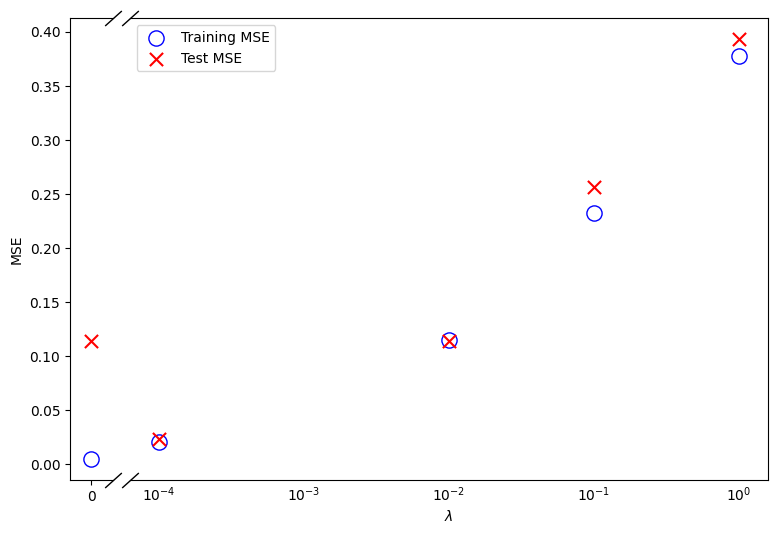

In [15]:
# I figured out how to do the broken axis thing from here: https://matplotlib.org/stable/gallery/subplots_axes_and_figures/broken_axis.html

fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True, gridspec_kw={'width_ratios': [0.2, 3]}, figsize=(9, 6))

plt.scatter
opacity=1.0
ax1.scatter(lams, training_mse, alpha=1.0, s=120.0, edgecolors="blue", color="white")
ax2.scatter(lams, training_mse, label="Training MSE", alpha=opacity, s=120.0, edgecolors="blue", color="white")
ax1.scatter(lams, test_mse, alpha=opacity, marker="x", s=90.0, color="red")
ax2.scatter(lams, test_mse, label="Test MSE", alpha=opacity, marker="x", s=90.0, color="red")
ax2.set_xscale("log")
ax2.get_xlim()
fig.subplots_adjust(wspace=0.05)

ax1.spines.right.set_visible(False)
ax2.spines.left.set_visible(False)

ax1.set_xticks([0], ["0"])
ax1.set_xlim([-1e-12, 1e-12])
ax2.tick_params(axis='both', which='both', length=0)

d = .9  # proportion of vertical to horizontal extent of the slanted line
kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
              linestyle="none", color='k', mec='k', mew=1, clip_on=False)
ax1.plot([1, 1], [0, 1], transform=ax1.transAxes, **kwargs)
ax2.plot([0, 0], [0, 1], transform=ax2.transAxes, **kwargs)

ax2.set_xlabel(r"$\lambda$")
ax1.set_ylabel(r"MSE")
plt.legend()

# Problem 5

(a)
When lambda is zero, the regularization term in the cost function goes to zero and this is equivalent to solving for the thetas that minimize the squared error on our training data. Because our training dataset is so small and sporadic, we clearly overfit to the training data and the resulting model looks nothing like the sinusoidal curve that we expect.

(b)
By including a small, nonzero value of lambda, we initially improve the MSE on the test data. This is because we are punishing model complexity, which drastically reduces the impact of some of the theta terms in the model. The resulting fit optimizes the competing goals of fitting the training data and also doing so with little model complexity. It is therefore unsurprising that the blue line in the figure representing the model with lambda=10^-4 more closely represents the sinusoid curve: the regularisation allows enough complexity to capture the shape of the curve, but not enough complexity where overfitting is a significant problem.

(c)
When lambda becomes too large, the resulting model is not able to capture the complexity of even the sinusoid curve. The sinusoid curve requires several powers of x in order to be well approximated over a 2pi interval by a polynomial and the lambda parameter is shutting down those terms corresponding to extra powers of x, leading to a much flatter, less complex model. Because of this trouble, the model becomes flatter and flatter, less and less able to curve and follow the training data points.

(d)
While regularisation can prevent overfitting, it does so by decreasing model complexity: the problem is that a certain minimum model complexity is required to fit to some datasets, so one must be careful to tune the lambda metaparameter to allow for the amount of complexity that the model needs, but not much more.

# Problem 6

![](problem6.png)

![](ttr5p2_cropped.png)

# Problem 7

![](problem7.png)
![](eq5p29.png)

![](problem_7_proof_corrected.png)

# Problem 8

In [16]:
def binary_logistic_regression_cost_function_gradient(X, y, theta):
    X = np.array(X, dtype="double")

    X = calculate_X(X)

    y = np.array(y, dtype="double")
    theta = np.array(theta, dtype="double")
    n = y.shape[0]
    current_sum = np.zeros_like(theta)
    for i in range(n):
        current_sum += y[i]*X[i,:] / (1+np.exp(y[i]*theta.T@X[i,:]))

    return -(1/n) * current_sum

In [17]:
BEDNAR = 1
NELSON = -1

X = np.array([
    [10.43, 5.72],
    [5.71, 4.14],
    [9.18, 6.18],
    [8.82, 5.15],
    [5.23, 2.47],
    [5.66, 3.14],
    [6.74, 2.73],
    [5.28, 2.91],
])

# y = np.array([
#     "Elder Bednar",
#     "Elder Bednar",
#     "Elder Bednar",
#     "Elder Bednar",        
#     "President Nelson",
#     "President Nelson",
#     "President Nelson",
#     "President Nelson",
# ])

y = np.array([
    BEDNAR,
    BEDNAR,
    BEDNAR,
    BEDNAR,        
    NELSON,
    NELSON,
    NELSON,
    NELSON,
])

![](gradient_descent_pseudocode.png)

In [23]:
from numpy.linalg import norm

def gradient_descent(gradient_func, x_train, y_train, initial_theta=None, gamma=0.1, stopping_criteria=1e-5, max_iterations=float('inf')):
    if initial_theta is None:
        initial_theta = np.zeros((x_train.shape[1]+1,), dtype="double")
    theta = initial_theta
    t = 0
    while True:
        theta_prev = theta
        # print(gradient_func(x_train, y_train, theta))
        theta = theta - gamma*gradient_func(x_train, y_train, theta)
        
        if t < max_iterations and norm(theta - theta_prev) > stopping_criteria:
            print(norm(theta-theta_prev))
            t += 1
            continue
        else:
            break

    return theta

In [24]:
theta_0 = np.array([0, 0, 0])
theta_hat_1 = gradient_descent(binary_logistic_regression_cost_function_gradient, X, y, initial_theta=theta_0, gamma=0.01)
# theta_hat_2 = gradient_descent(binary_logistic_regression_cost_function_gradient, X, y, initial_theta=theta_0, gamma=0.001)

0.009373260255242034
0.0077523649354273435
0.006453519641151686
0.005420736142869347
0.004606393871696746
0.003970794002774091
0.0034808349854142154
0.003108602107548444
0.002830273689751335
0.002625477926353124
0.0024770157748986703
0.0023707392696520994
0.0022953881920551654
0.0022422977178471037
0.002204998129684914
0.0021787763364323294
0.002160263372027365
0.0021470843842823326
0.002137581800790297
0.0021306066091690175
0.0021253660298875864
0.002121314765540014
0.002118078501567925
0.0021154006233585483
0.0021131053461487716
0.0021110723113032357
0.0021092191314362263
0.002107489418221627
0.0021058445796301502
0.002104258203393903
0.0021027122126536413
0.002101194235063405
0.0020996958024327404
0.002098211118705073
0.00209673621682037
0.002095268381673769
0.002093805755161744
0.0020923470658386106
0.002090891443856718
0.0020894382942799727
0.00208798721035461
0.002086537914133377
0.002085090215825776
0.0020836439859689246
0.0020821991363761077
0.0020807556070951594
0.002079313357

In [25]:
print(theta_hat_1)
# print(theta_hat_2)

[-16.60027811  -3.395411    10.05862687]


In [42]:
def g(x, theta):
    x = np.concatenate(([1.0], x))
    return np.exp(theta.T@x) / (1 + np.exp(theta.T@x))
print(theta_hat_1)
g(X[7, :], theta_hat_1)

[-16.60027811  -3.395411    10.05862687]


np.float64(0.005181611942709914)